<a href="https://colab.research.google.com/github/cintheryewang/cellpose/blob/main/notebooks/run_cellpose_GPU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Running cellpose in colab with a GPU

(thanks to Matteo Carandini for setting this up)

UPDATED DEC 2020 for TORCH VERSION cellpose v0.6

UPDATED NOV 2021 for cellpose / omnipose v0.7

## installation

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

Note that cellpose uses the latest version of numpy, so please click the "Restart runtime" button once the install completes.

In [2]:
!pip install "opencv-python-headless<4.3"
!pip install cellpose

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 MB 25.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.84
    Uninstalling opencv-python-headless-4.10.0.84:
      Successfully uninstalled opencv-python-headless-4.10.0.84
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.19 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 3.4.18.65 which is incompatible.
albumentations 1.4.20 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 3.4.18.65 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.2/215.2 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 90.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 MB 17.4 MB/s eta 0:00:00


Check CUDA version and GPU

In [3]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Thu Nov 14 03:26:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8               9W /  7

import libraries and check GPU (the first time you import cellpose the models will download).

In [4]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models, core

use_GPU = core.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

# call logger_setup to have output of cellpose written
from cellpose.io import logger_setup
logger_setup();


>>> GPU activated? 1
creating new log file


Download sample images

Downloading: "http://www.cellpose.org/static/images/img02.png" to img02.png
100%|██████████| 131k/131k [00:00<00:00, 1.89MB/s]
Downloading: "http://www.cellpose.org/static/images/img03.png" to img03.png
100%|██████████| 135k/135k [00:00<00:00, 1.77MB/s]
Downloading: "http://www.cellpose.org/static/images/img05.png" to img05.png
100%|██████████| 180k/180k [00:00<00:00, 2.25MB/s]
Downloading: "http://www.cellpose.org/static/data/rgb_3D.tif" to rgb_3D.tif
100%|██████████| 1.63M/1.63M [00:00<00:00, 8.62MB/s]


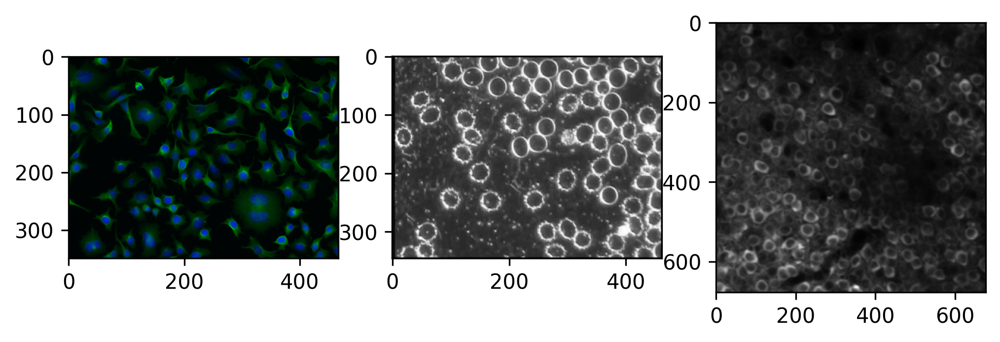

In [ ]:
from cellpose import utils
# I will download images from website
urls = ['http://www.cellpose.org/static/images/img02.png',
        'http://www.cellpose.org/static/images/img03.png',
        'http://www.cellpose.org/static/images/img05.png',
        'http://www.cellpose.org/static/data/rgb_3D.tif']
files = []
for url in urls:
    parts = urlparse(url)
    filename = os.path.basename(parts.path)
    if not os.path.exists(filename):
        sys.stderr.write('Downloading: "{}" to {}\n'.format(url, filename))
        utils.download_url_to_file(url, filename)
    files.append(filename)

# REPLACE FILES WITH YOUR IMAGE PATHS
# files = ['img0.tif', 'img1.tif']

imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs[:-1]):
  plt.subplot(1,3,k+1)
  plt.imshow(img)

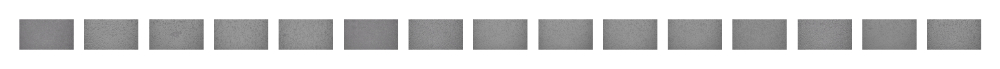

In [6]:
import os
import sys
import matplotlib.pyplot as plt
from skimage import io
from cellpose import utils

# 使用本地图像路径替换 `files` 列表
# 请将以下路径替换为你的本地图像文件路径
# files = [
#     'path/to/your/local_image1.png',
#     'path/to/your/local_image2.png',
#     'path/to/your/local_image3.png',
# ]

# 指定图像文件夹路径
image_dir = '/content/'

# 获取当前目录下的所有 jpg 文件（不递归）
files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.lower().endswith('.jpg')]


# 读取本地图像
imgs = [io.imread(f) for f in files if os.path.exists(f)]

# 检查是否成功加载了图像
if len(imgs) == 0:
    sys.stderr.write('没有加载到任何图像，请检查文件路径。\n')
    sys.exit(1)

# 可视化图像
plt.figure()
for k, img in enumerate(imgs):
    plt.subplot(1, len(imgs), k + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()



## run cellpose on 2D sample images

(exclude last download, it's a 3D tiff)

In [8]:
# RUN CELLPOSE

imgs_2D = imgs.copy()

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto3')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
# channels = [[2,3], [0,0], [0,0]]
# channels = [1,1]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images

masks, flows, styles, diams = model.eval(imgs_2D, diameter=None, flow_threshold=None, channels=channels)

100%|██████████| 25.3M/25.3M [00:01<00:00, 16.0MB/s]
/usr/local/lib/python3.10/dist-packages/cellpose/resnet_torch.py:271: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  stat

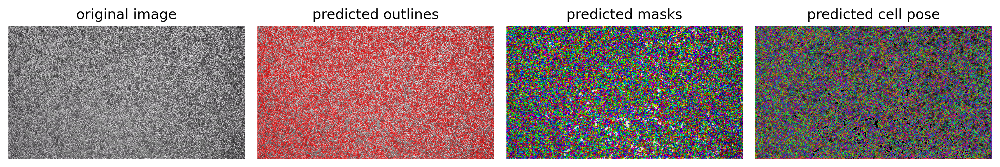

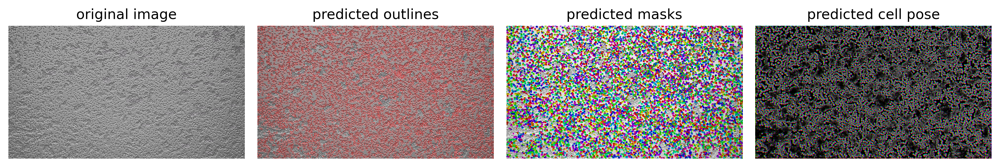

IndexError: list index out of range

<Figure size 3600x1500 with 0 Axes>

In [9]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

In [ ]:
from cellpose import io

io.masks_flows_to_seg(imgs_2D, masks, flows, diams, files, channels)

## run cellpose 3D

There are two ways to run cellpose in 3D, this cell shows both, choose which one works best for you.

First way: computes flows from 2D slices and combines into 3D flows to create masks



In [ ]:
# test 3D stack

img_3D = imgs[-1]

# * with 3D you have to set the diameter manually (no auto detect) *

### TWO WAYS TO RUN CELLPOSE IN 3D

# 1. computes flows from 2D slices and combines into 3D flows to create masks
print('running cellpose 2D slice flows => masks')
masks, flows, styles, _ = model.eval(img_3D, channels=[2,1], diameter=25, do_3D=True)


running cellpose 2D slice flows => masks
2022-01-25 20:24:32,906 [INFO] ~~~ FINDING MASKS ~~~
2022-01-25 20:24:32,908 [INFO] multi-stack tiff read in as having 75 planes 2 channels
2022-01-25 20:24:32,967 [INFO] running YX: 75 planes of size (75, 75)
2022-01-25 20:24:36,136 [INFO] 100%|##########| 3/3 [00:00<00:00,  4.87it/s]
2022-01-25 20:24:36,168 [INFO] running ZY: 75 planes of size (75, 75)
2022-01-25 20:24:39,089 [INFO] 100%|##########| 3/3 [00:00<00:00,  4.86it/s]
2022-01-25 20:24:39,121 [INFO] running ZX: 75 planes of size (75, 75)
2022-01-25 20:24:42,032 [INFO] 100%|##########| 3/3 [00:00<00:00,  4.84it/s]
2022-01-25 20:24:42,060 [INFO] network run in 9.15s
2022-01-25 20:24:42,658 [INFO] masks created in 0.59s
2022-01-25 20:24:42,700 [INFO] >>>> TOTAL TIME 9.79 sec


Second way: computes masks in 2D slices and stitches masks in 3D based on mask overlap

Note stitching (with stitch_threshold > 0) can also be used to track cells over time.

In [ ]:
# 2. computes masks in 2D slices and stitches masks in 3D based on mask overlap
print('running cellpose 2D + stitching masks')
masks_stitched, flows_stitched, styles_stitched, _ = model.eval(img_3D, channels=[2,1], diameter=25, do_3D=False, stitch_threshold=0.5)

running cellpose 2D + stitching masks
2022-01-25 20:24:42,715 [INFO] ~~~ FINDING MASKS ~~~
2022-01-25 20:24:42,717 [INFO] multi-stack tiff read in as having 75 planes 2 channels
2022-01-25 20:25:18,302 [INFO] 100%|##########| 75/75 [00:35<00:00,  2.11it/s]
2022-01-25 20:25:18,306 [INFO] network run in 35.58s
2022-01-25 20:25:23,252 [INFO] stitching 75 planes using stitch_threshold=0.500 to make 3D masks
2022-01-25 20:25:24,152 [INFO] masks created in 5.84s
2022-01-25 20:25:24,191 [INFO] >>>> TOTAL TIME 41.48 sec


Results from 3D flows => masks computation

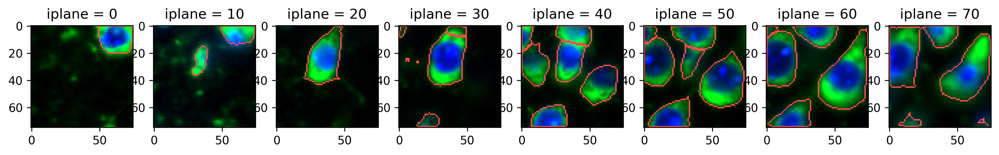

In [ ]:
# DISPLAY RESULTS 3D flows => masks
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

Results from stitching

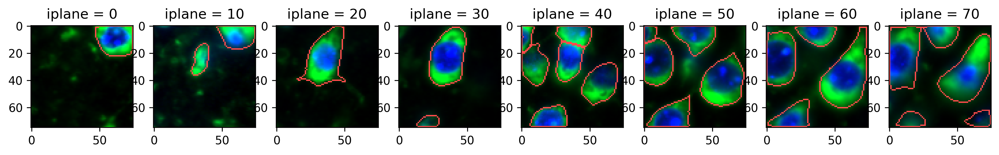

In [ ]:
# DISPLAY RESULTS stitching
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks_stitched[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

## connect to your google drive

so that you can run your own files (alternatively, upload them directly to the Files tab)

In [ ]:
## RUN THIS CELL TO ACCESS GOOGLE DRIVE

# mount your google drive here if you want to access your own files
from google.colab import drive
drive.mount('/content/drive')

# files will be in
# file_root = '/content/drive/My Drive/'